In [1]:
# http://hleecaster.com/ml-multiple-linear-regression-example/
# 다중회귀 실험

In [2]:
import pandas as pd
import pandas_profiling


In [3]:
dust_data = pd.read_csv('DataSet.csv')

In [4]:
dust_data.head()

,Station code,Date,SO2,CO,O3,NO2,PM10,PM25,Temp,Prec,WS,Humi,Pres,cbwd
0,111121,2018-01-01,0.004833,0.554167,0.014583,0.029292,32.666667,17.791667,-1.3,0.0,1.4,39.1,1016.8,290
1,111122,2018-01-01,0.005417,0.541667,0.011375,0.039750,49.541667,19.899749,-1.3,0.0,1.4,39.1,1016.8,290
2,111123,2018-01-01,0.007208,0.604167,0.015292,0.030250,34.375000,17.333333,-1.3,0.0,1.4,39.1,1016.8,290
3,111124,2018-01-01,0.006333,0.433333,0.011542,0.034167,37.125000,19.899749,-1.3,0.0,1.4,39.1,1016.8,290
4,111125,2018-01-01,0.003667,0.495833,0.020833,0.028708,36.208333,19.899749,-1.3,0.0,1.4,39.1,1016.8,290


In [5]:
dust_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43536 entries, 0 to 43535
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Station code  43536 non-null  int64  
 1   Date          43536 non-null  object 
 2   SO2           43536 non-null  float64
 3   CO            43536 non-null  float64
 4   O3            43536 non-null  float64
 5   NO2           43536 non-null  float64
 6   PM10          43536 non-null  float64
 7   PM25          43536 non-null  float64
 8   Temp          43536 non-null  float64
 9   Prec          43536 non-null  float64
 10  WS            43536 non-null  float64
 11  Humi          43536 non-null  float64
 12  Pres          43536 non-null  float64
 13  cbwd          43536 non-null  int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 4.7+ MB


In [13]:
dust_data.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
from sklearn.model_selection import train_test_split

# x = dust_data[['Station code','Date','SO2','O3' 'NO2', 'PM10', 'PM25', 'Temp', 'Prec', 'WS', 'Humi', 'Pres', 'cbwd']]
x = dust_data[['Temp', 'Prec', 'WS', 'Humi', 'Pres', 'cbwd']]

y = dust_data[['CO']]

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.8, test_size=0.2)


In [8]:
x_train.head(5)

,Temp,Prec,WS,Humi,Pres,cbwd
17499,3.3,0.0,2.8,40.9,1009.4,290
13408,-7.2,0.0,1.5,27.0,1025.7,290
23269,29.2,6.4,1.5,76.9,992.7,270
577,4.7,0.2,1.4,63.9,1012.8,290
21405,25.5,1.4,1.4,70.5,990.9,50


In [9]:
# 모델 생성
from sklearn.linear_model import LinearRegression
mlr = LinearRegression()
mlr.fit(x_train, y_train)

LinearRegression()

In [10]:
y_predict = mlr.predict(x_test)

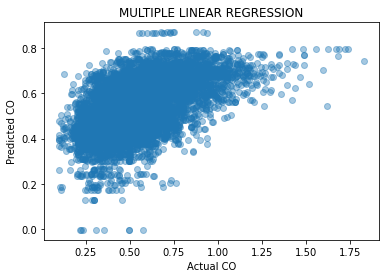

In [11]:
# 예측값과 실제값 비교


import matplotlib.pyplot as plt
plt.scatter(y_test, y_predict, alpha=0.4)
plt.xlabel("Actual CO")
plt.ylabel("Predicted CO")
plt.title("MULTIPLE LINEAR REGRESSION")
plt.show()

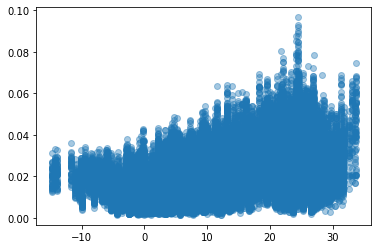

In [12]:
plt.scatter(dust_data[['Temp']], dust_data[['O3']], alpha=0.4)
plt.show()

prec는 0이 대부분이라 삭제하는게 어떨지?